Here, I test local hopping of ISs based on Lee et al. NAR 2016.

I generate random insertion data set, compare with our results with AD test, and combine them with Fisher's method.

Note that simple insertions here include simple transpositions, where a composite transposition is inserted without other SVs.
For instance, as follows:

```Julia
			inserts_df_simple_ = @chain inserts_df_ begin
				@rsubset :sv in ["simple_insertion", "simple_transposition"]
			end
```

# Overview 
1. load data
2. calculate ECDF
3. analyze KS-tests + plot qq plots
4. analyze AD-tests + Fishers tests
5. aggregate all the plots into one-page figure

# Load data

In [1]:
import Pkg
using RCall
using Random
using DataFrames, DataFramesMeta
using Revise
using CSV
using Arrow

In [2]:
figure_export_dir = "./exp/figs/analyze_is_distance_11"
data_export_dir = "./tmp/analyze_is_distance_11"
figure_prefix = "20240703_"
mkpath(figure_export_dir)
mkpath(data_export_dir)
base_dir = "exp/multiple_runs11/export/classify_IS_events/"
genome_stats_df = CSV.read(joinpath(base_dir, "genome_stats.csv"), DataFrame)
inserts_df = CSV.read(joinpath(base_dir, "simple_insertion_distances.csv"), DataFrame)
is_pos_df = CSV.read(joinpath(base_dir, "IS_positions.csv"), DataFrame)
#is_clustered_pos_df = CSV.read(joinpath(base_dir, "clustered_IS_positions.csv"), DataFrame)
first(inserts_df, 5)

Row,insert_id,pos,position_status,sv,closest_original_id,closest_original_distance,Line,Gen
,Int64,Int64,String3,String31,Int64,Int64,String7,Int64
1,3,552533,new,unknown,4,4634,L01-1,2
2,6,560570,new,unknown,5,311,L01-1,2
3,7,711466,new,simple_insertion,5,151207,L01-1,2
4,10,1205560,new,unknown,9,13060,L01-1,2
5,15,1675567,new,simple_insertion,14,171676,L01-1,2


In [61]:
@chain inserts_df begin # composition of insertions. unlike the table in main text, I included simple transpositions to increase n
    @rsubset !(:Line .== "L04-1" .&& :Gen .== 3)
    groupby(:sv)
    combine(nrow => :n)
end

Row,sv,n
,String31,Int64
1,unknown,523
2,simple_insertion,359
3,simple_transposition,8


# Create ECDF data sets

In [3]:
function circular_dicstance(x, y, genome_size)
	min(abs(x - y), genome_size - abs(x - y))
end

function generate_random_insretion_distances(is_pos_list, genome_size, n, rng)
	inserts = rand(rng, 1:genome_size, n)
	closest_is = zeros(Int64, n)
	distance = zeros(Int64, n)
	for i in 1:n
		distance[i], closest_is[i] = findmin(map(x -> circular_dicstance(x, inserts[i], genome_size), is_pos_list))
	end
	return inserts, closest_is, distance
end

function generate_random_insretion_distances(is_start, is_end, genome_size, n, rng)
	inserts = rand(rng, 1:genome_size, n)
	closest_is = repeat([-1], n)
	distance = repeat([-1], n)
	for i in 1:n
		distance_s, closest_is_s = findmin(map(x -> circular_dicstance(x, inserts[i], genome_size), is_start))
		distance_e, closest_is_e = findmin(map(x -> circular_dicstance(x, inserts[i], genome_size), is_end))
		distance[i] = min(distance_s, distance_e)
		closest_is[i] = distance_s < distance_e ? closest_is_s : closest_is_e
		if is_start[closest_is[i]] <= inserts[i] <= is_end[closest_is[i]]
			distance[i] = 0
		end
	end
	return inserts, closest_is, distance
end

generate_random_insretion_distances (generic function with 2 methods)

## Multiple data sets

Data: gen2
Facet: prefix
sample size 1e4
n_bins 1e4
output facetted ecdf plots
input ispos, isdistance, genomesize
r inputs :
	1. sampled distribution insert, closest_is, distance, prefix, gen
	2. observed distance, prefix, gen, distance

In [4]:
function ECDF(data)
    n = length(data)
    x = sort(data)
    y = collect(1:1:n)/n
    return(x,y)
end

ECDF (generic function with 1 method)

In [5]:
is_pos_df |> x -> first(x, 5)

Row,start,end,IS_strand,max_alignment_length,length,cluster_id,Line,Gen
,Int64,Int64,String7,Int64,Int64,Int64,String7,Int64
1,476928,480020,reverse,3093,3093,0,L01-1,1
2,557167,560259,reverse,3093,3093,1,L01-1,1
3,1187831,1192502,forward,3093,4672,2,L01-1,1
4,1405123,1408215,forward,3093,3093,3,L01-1,1
5,1499230,1503892,reverse,3093,4663,4,L01-1,1


In [6]:
# Calculate the ecdf for random insertions 
lines = genome_stats_df.Prefix |> unique
estimated_is_pos_df = DataFrame()
ecdf_df = DataFrame()
gids = [2,3]
seed = 1234
rng = Random.MersenneTwister(seed)
if isfile(joinpath(data_export_dir, "simulated_IS_distances.arrow"))
	ecdf_df = Arrow.Table(joinpath(data_export_dir, "simulated_IS_distances.arrow")) |> DataFrame
else
	for line in lines
		for gid in gids
			genome_size_ = @chain genome_stats_df begin
				@rsubset :Prefix == line && :gen_id == gid-1
				@select(:genome_size)
			end
			genome_size = genome_size_.genome_size[1]
			is_pos_list_anc = @chain is_pos_df begin
				@rsubset :Line == line && :Gen == gid-1
			end
			res_ = generate_random_insretion_distances(is_pos_list_anc.start, is_pos_list_anc.end, genome_size, 10000, rng)
			parent = split(line, "-")[1]
			estimated_is_pos_df_raw = DataFrame(
				Line = repeat([line], 10000),
				Parent = repeat([parent], 10000),
				Gen = repeat([gid], 10000),
				Insertion = res_[1],
				Closest_IS = res_[2],
				Distance = res_[3]
			)
			estimated_is_pos_df_raw = estimated_is_pos_df_raw[estimated_is_pos_df_raw.Distance .> 100, :]
			estimated_is_pos_df = vcat(estimated_is_pos_df, estimated_is_pos_df_raw)
			ecdf = ECDF(estimated_is_pos_df_raw.Distance)
			ecdf_df = vcat(ecdf_df,DataFrame(
				Line = repeat([line], length(ecdf[1])),
				Parent = repeat([parent], length(ecdf[1])),
				Gen = repeat([gid], length(ecdf[1])),
				Distance = ecdf[1],
				ECDF = ecdf[2])
			)
			print(line, " ", gid, "; ")
		end
	end
	Arrow.write(joinpath(data_export_dir, "simulated_IS_distances.arrow"), ecdf_df)
end
ecdf_df |> x -> first(x, 5)

L01-1 2; L01-1 3; L01-2 2; L01-2 3; L01-3 2; L01-3 3; L01-4 2; L01-4 3; L02-1 2; L02-1 3; L02-2 2; L02-2 3; L02-3 2; L02-3 3; L02-4 2; L02-4 3; L03-1 2; L03-1 3; L03-2 2; L03-2 3; L03-3 2; L03-3 3; L03-4 2; L03-4 3; L04-1 2; L04-1 3; L04-2 2; L04-2 3; L04-3 2; L04-3 3; L04-4 2; L04-4 3; L05-1 2; L05-1 3; L05-2 2; L05-2 3; L05-3 2; L05-3 3; L05-4 2; L05-4 3; L06-1 2; L06-1 3; L06-2 2; L06-2 3; L06-3 2; L06-3 3; L06-4 2; L06-4 3; L07-1 2; L07-1 3; L07-2 2; L07-2 3; L07-3 2; L07-3 3; L07-4 2; L07-4 3; L08-1 2; L08-1 3; L08-2 2; L08-2 3; L08-3 2; L08-3 3; L08-4 2; L08-4 3; L09-1 2; L09-1 3; L09-2 2; L09-2 3; L09-3 2; L09-3 3; L09-4 2; L09-4 3; L10-1 2; L10-1 3; L10-2 2; L10-2 3; L10-3 2; L10-3 3; L10-4 2; L10-4 3; L11-1 2; L11-1 3; L11-2 2; L11-2 3; L11-3 2; L11-3 3; L11-4 2; L11-4 3; 

Row,Line,Parent,Gen,Distance,ECDF
,String7,SubStrin…,Int64,Int64,Float64
1,L01-1,L01,2,143,0.000101082
2,L01-1,L01,2,171,0.000202163
3,L01-1,L01,2,173,0.000303245
4,L01-1,L01,2,187,0.000404326
5,L01-1,L01,2,188,0.000505408


## Datasets for 8th passage sharing direct ancestors

In [7]:
# parent line  (for only gen2)
parents = (x -> split(x,"-")[1]).(lines) |> unique
observed_ecdf_df = DataFrame()
observed_ecdf_simple_df = DataFrame()
if(isfile(joinpath(data_export_dir, "observed_IS_distances.arrow")) && isfile(joinpath(data_export_dir, "observed_simple_IS_distances.arrow")))
	observed_ecdf_df = Arrow.Table(joinpath(data_export_dir, "observed_IS_distances.arrow")) |> DataFrame
	observed_ecdf_simple_df = Arrow.Table(joinpath(data_export_dir, "observed_simple_IS_distances.arrow")) |> DataFrame
else
	for parent in parents
			inserts_df_ = @chain inserts_df begin
				@rsubset (x -> split(x, "-")[1])(:Line) == parent  && :closest_original_distance > 100 && :Gen == 2
			end
			ecdf_raw = ECDF(inserts_df_.closest_original_distance)
			ecdf_raw_df_ = DataFrame(
				Parent = repeat([parent], length(ecdf_raw[1])),
				Gen = 2,
				Distance = ecdf_raw[1],
				ECDF = ecdf_raw[2]
			)
			observed_ecdf_df = vcat(observed_ecdf_df, ecdf_raw_df_)
			inserts_df_simple_ = @chain inserts_df_ begin
				@rsubset :sv in ["simple_insertion", "simple_transposition"]
			end
			ecdf_raw_simple = ECDF(inserts_df_simple_.closest_original_distance)
			ecdf_raw_simple_df_ = DataFrame(
				Parent = repeat([parent], length(ecdf_raw_simple[1])),
				Gen = 2,
				Distance = ecdf_raw_simple[1],
				ECDF = ecdf_raw_simple[2]
			)
			observed_ecdf_simple_df = vcat(observed_ecdf_simple_df, ecdf_raw_simple_df_)
	end
	Arrow.write(joinpath(data_export_dir, "observed_IS_distances.arrow"), observed_ecdf_df)
	Arrow.write(joinpath(data_export_dir, "observed_simple_IS_distances.arrow"), observed_ecdf_simple_df)
end
size(observed_ecdf_df)

(480, 4)

In [8]:
observed_ecdf_df[observed_ecdf_df.Gen .== 2, :] |> x -> first(x, 5)

Row,Parent,Gen,Distance,ECDF
,SubStrin…,Int64,Int64,Float64
1,L01,2,147,0.0227273
2,L01,2,274,0.0454545
3,L01,2,311,0.0681818
4,L01,2,617,0.0909091
5,L01,2,2462,0.113636


In [9]:
observed_ecdf_df[observed_ecdf_df.Gen .== 3, :] |> x -> first(x, 5)

Row,Parent,Gen,Distance,ECDF
,SubStrin…,Int64,Int64,Float64


In [10]:
print(ecdf_df |> first, observed_ecdf_df |> first, observed_ecdf_simple_df |> first)

DataFrameRow
 Row │ Line     Parent     Gen    Distance  ECDF        
     │ String7  SubStrin…  Int64  Int64     Float64     
─────┼──────────────────────────────────────────────────
   1 │ L01-1    L01            2       143  0.000101082DataFrameRow
 Row │ Parent     Gen    Distance  ECDF      
     │ SubStrin…  Int64  Int64     Float64   
─────┼───────────────────────────────────────
   1 │ L01            2       147  0.0227273DataFrameRow
 Row │ Parent     Gen    Distance  ECDF     
     │ SubStrin…  Int64  Int64     Float64  
─────┼──────────────────────────────────────
   1 │ L01            2       147  0.047619

In [11]:
observed_ecdf_df = observed_ecdf_df[!, [:Parent, :Gen, :Distance, :ECDF]]
observed_ecdf_simple_df = observed_ecdf_simple_df[!, [:Parent, :Gen, :Distance, :ECDF]]

observed_ecdf_df |> first

Row,Parent,Gen,Distance,ECDF
,SubStrin…,Int64,Int64,Float64
1,L01,2,147,0.0227273


In [12]:
R"""
library(tidyverse)
library(cowplot)
library(latex2exp)
library(stats)
cbp <- c("#999999", "#E69F00", "#56B4E9", "#009E73", 
                       "#F0E442", "#0072B2", "#D55E00", "#CC79A7")
"""

┌ Warning: RCall.jl: ── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
│ ✔ dplyr     1.1.3     ✔ readr     2.1.4
│ ✔ forcats   1.0.0     ✔ stringr   1.5.0
│ ✔ ggplot2   3.4.3     ✔ tibble    3.2.1
│ ✔ lubridate 1.9.2     ✔ tidyr     1.3.0
│ ✔ purrr     1.0.2     
│ ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
│ ✖ dplyr::filter() masks stats::filter()
│ ✖ dplyr::lag()    masks stats::lag()
│ ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172
┌ Warning: RCall.jl: 
│ Attaching package: ‘cowplot’
│ 
│ The following object is masked from ‘package:lubridate’:
│ 
│     stamp
│ 
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172


RObject{StrSxp}
[1] "#999999" "#E69F00" "#56B4E9" "#009E73" "#F0E442" "#0072B2" "#D55E00"
[8] "#CC79A7"


┌ Warning: RCall.jl: 
│ Attaching package: ‘scales’
│ 
│ The following object is masked from ‘package:purrr’:
│ 
│     discard
│ 
│ The following object is masked from ‘package:readr’:
│ 
│     col_factor
│ 
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172
┌ Warning: RCall.jl: 
│ Attaching package: ‘lemon’
│ 
│ The following object is masked from ‘package:purrr’:
│ 
│     %||%
│ 
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172
┌ Warning: RCall.jl: Warning in RColorBrewer::brewer.pal(2, "Set1") :
│   minimal value for n is 3, returning requested palette with 3 different levels
│ 
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172
┌ Warning: RCall.jl: Warning: Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
│ ℹ Please use `linewidth` instead.
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172


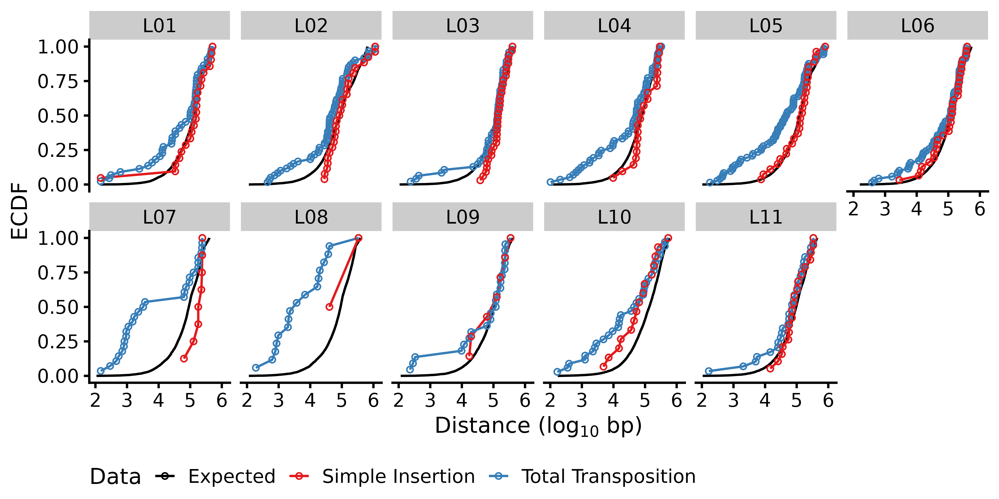

In [13]:
figure_name = figure_prefix * "is_distance_ecdf_gen2"
@rput ecdf_df
@rput observed_ecdf_df
@rput observed_ecdf_simple_df
@rput figure_name
@rput figure_export_dir
R"""
Sys.setlocale("LC_COLLATE","C") # order by dictionary order
library(scales)
library(lemon)
first_lines <- ecdf_df$Parent %>% unique
first_lines <- map(first_lines, function(x){paste0(x, "-1")})
ecdf2 <- ecdf_df %>% filter(Line %in% first_lines) %>% mutate(Line = Parent) %>%
	select(-Line) 
ecdf2["Data"] <- "Expected"
observed_ecdf_df["Data"] <- "Total Transposition"
observed_ecdf_simple_df["Data"] <- "Simple Insertion"
cols <- c("black", RColorBrewer::brewer.pal(2, "Set1"))
merged_df <- ecdf2 %>% rbind(observed_ecdf_df) %>% rbind(observed_ecdf_simple_df) %>% filter(Gen == 2)
p <- merged_df %>% mutate(Line = Parent) %>%
ggplot(aes(x = log10(Distance), y = ECDF, color = Data)) +
geom_line(size = .5) +
geom_point(data=merged_df %>% filter(Data!="Expected"), size=1, shape =1) +
labs(x = TeX("Distance ($log_{10}$ bp)"), y = "ECDF") +
 #scale_color_manual(values = cbp)+
 #scale_color_brewer(palette = "Set1")+
 scale_color_manual(values = cols)+
facet_wrap(~Parent, ncol = 6)+
theme_half_open(10)+
theme(legend.direction = "horizontal", legend.position = "bottom")
ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=160, height=80, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=160, height=80, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=160, height=80, units="mm", dpi=1000)

p.ecdf.gen8 <- p
"""
display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))

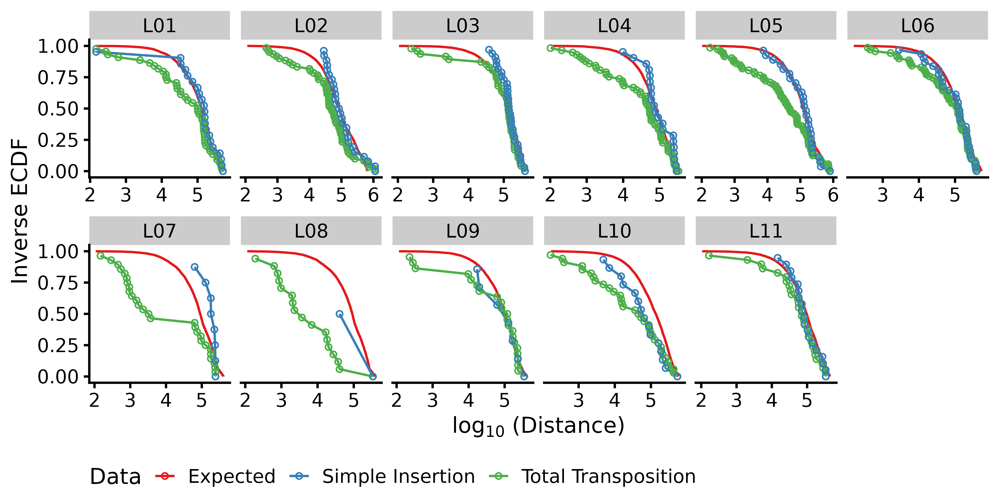

In [14]:
figure_name = figure_prefix * "is_distance_iecdf_gen"
@rput figure_name
R"""
p <- merged_df %>% mutate(Line = Parent) %>%
ggplot(aes(x = log10(Distance), y = 1-ECDF, color = Data)) +
geom_line(size = .5) +
geom_point(data=merged_df %>% filter(Data!="Expected"), size=1, shape =1) +
labs(x = TeX("$log_{10}$ (Distance)"), y = "Inverse ECDF") +
 #scale_color_manual(values = cbp)+
 scale_color_brewer(palette = "Set1")+
 #scale_y_log10()+
facet_wrap(~Parent, ncol = 6, scale="free_x")+
theme_half_open(10)+
theme(legend.direction = "horizontal", legend.position = "bottom")
ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=160, height=80, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=160, height=80, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=160, height=80, units="mm", dpi=1000)
"""
display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))

# Statistics for all data
I want to know whether the above difference is statistically significant

In [15]:
parents = (x -> split(x,"-")[1]).(lines) |> unique
observed_ecdf_df_all = DataFrame()
observed_ecdf_simple_df_all = DataFrame()
for line in lines
	for Gen in 2:3
		parent = split(line, "-")[1]
		subline = split(line, "-")[2]
		inserts_df_ = @chain inserts_df begin
			@rsubset :Line == line && :Gen == Gen
		end
		ecdf_raw = ECDF(inserts_df_.closest_original_distance)
		ecdf_raw_df_ = DataFrame(
			Parent = repeat([parent], length(ecdf_raw[1])),
			Gen = Gen,
			Distance = ecdf_raw[1],
			ECDF = ecdf_raw[2],
			subline = subline,
			Line = line
		)
		observed_ecdf_df_all = vcat(observed_ecdf_df_all, ecdf_raw_df_)
		inserts_df_simple_ = @chain inserts_df_ begin
			@rsubset :sv in ["simple_insertion", "simple_transposition"]
		end
		ecdf_raw_simple = ECDF(inserts_df_simple_.closest_original_distance)
		ecdf_raw_simple_df_ = DataFrame(
			Parent = repeat([parent], length(ecdf_raw_simple[1])),
			Gen = Gen,
			Distance = ecdf_raw_simple[1],
			ECDF = ecdf_raw_simple[2],
			subline = subline,
			Line = line
		)
		observed_ecdf_simple_df_all = vcat(observed_ecdf_simple_df_all, ecdf_raw_simple_df_)
	end
end
size(observed_ecdf_df_all)

(904, 6)

## With KS test
KS tests were not used and ADtest was used in the paper. QQplots of this paper was used though.
### All data

In [16]:
@rput parents
@rput lines
@rput observed_ecdf_df_all
@rput observed_ecdf_simple_df_all
R"""

results_list <- list()

for(line in lines){
	for(Gen_ in c(2,3)){
		obs <- observed_ecdf_df_all %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
		exp <- ecdf_df %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
		results <- ks.test(obs, exp, alternative = "greater")
		results_list <- c(results_list, list(results))
	}
}

lapply(results_list, function(x){x$p.value}) %>% unlist
"""


┌ Warning: RCall.jl: Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ War

RObject{RealSxp}
 [1] 2.409833e-01 1.660340e-01 1.674815e-03 1.273750e-01 2.715471e-01
 [6] 1.784274e-02 5.678360e-01 1.744520e-01 2.017183e-01 4.954989e-02
[11] 3.227309e-01 3.741167e-02 3.008998e-02 1.113628e-01 6.998840e-02
[16] 4.475549e-04 2.987301e-01 2.491182e-02 5.462712e-01 2.923300e-02
[21] 1.872105e-01 4.966793e-01 4.450175e-01 9.781200e-01 3.624206e-01
[26] 5.451140e-02 8.879216e-05 2.950376e-01 4.841419e-01 9.236955e-01
[31] 1.890939e-01 7.883413e-01 2.852139e-02 6.537440e-02 2.191579e-02
[36] 2.120899e-02 1.780579e-02 9.495371e-03 7.600085e-04 1.294075e-02
[41] 3.738064e-01 3.804824e-03 2.350256e-01 1.785410e-01 3.241901e-01
[46] 1.033162e-01 8.440746e-02 6.419037e-01 2.334273e-03 2.315500e-01
[51] 3.603174e-02 9.487655e-03 2.020480e-02 3.442096e-01 1.044365e-01
[56] 5.177921e-01 7.644578e-04 3.634241e-03 3.031147e-02 1.446167e-02
[61] 1.812548e-02 2.731148e-01 1.196704e-02 2.507046e-01 8.444125e-01
[66] 1.009529e-02 3.154187e-01 8.196505e-03 1.654037e-01 1.759037e-01
[71

In [17]:
R"""
ks.total <- data.frame(total = lapply(results_list, function(x){x$p.value}) %>% unlist)
""";

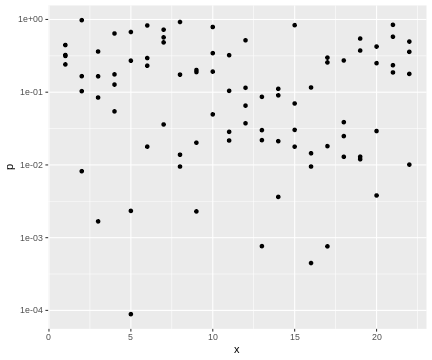

RObject{VecSxp}


In [18]:
R"""
data.frame(p = lapply(results_list, function(x){x$p.value}) %>% unlist, x = 1:22) %>%
ggplot(aes(x=x, y = p))+
geom_point()+
scale_y_log10()
"""

In [19]:
R"""
quantile.df.total <- data.frame()
for(line in lines){
	for(Gen_ in c(2,3)){
		obs <- observed_ecdf_df_all %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
		exp <- ecdf_df %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
  # Compute the quantiles
  q1 <- quantile(obs, probs=seq(0, 1, length.out=length(obs)))
  q2 <- quantile(exp, probs=seq(0, 1, length.out=length(obs)))
  df <- data.frame(q1, q2, Data = paste0(line, "_", Gen_))
  quantile.df.total <- rbind(quantile.df.total, df)
	}
}
quantile.df.total %>% head
"""

RObject{VecSxp}
          q1       q2    Data
0%       311    143.0 L01-1_2
12.5%   4634  25448.0 L01-1_2
25%    13060  54869.0 L01-1_2
37.5%  33484  91046.5 L01-1_2
50%   151207 129777.0 L01-1_2
62.5% 161929 174103.5 L01-1_2


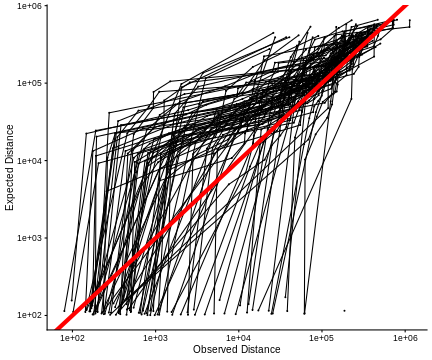

RObject{VecSxp}


In [20]:
R"""
p.qq.total <- ggplot(quantile.df.total, aes(x=q1, y=q2, group = Data)) + 
  geom_line() +
  geom_point(size=0.3) + 
  geom_abline(intercept = 0, slope = 1, size = 2, color = "red") + 
  xlab("Observed Distance") + 
  ylab("Expected Distance") +
  scale_x_log10()+
  scale_y_log10() +
  theme_half_open(10)
"""

### For only simple insertions

In [21]:
R"""

results_list.simple <- c()

cnt <- 0
for(line in lines){
	for(Gen_ in c(2,3)){
		obs <- observed_ecdf_simple_df_all %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
		exp <- ecdf_df %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
		cnt <- cnt + 1
		tryCatch({
			results <- ks.test(obs, exp, alternative = "greater")
			#results_list.simple <- c(results_list.simple, results$p.value)}
			results_list.simple[cnt] <- results$p.value}
			,
			error = function(e){
				#results_list.simple <- c(results_list.simple, 1.0)
				results_list.simple[cnt] <- 1.0
		})
	}
}

#lapply(results_list.simple, function(x){x$p.value}) %>% unlist
results_list.simple 
"""


┌ Warning: RCall.jl: Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ Warning in ks.test.default(obs, exp, alternative = "greater") :
│   p-value will be approximate in the presence of ties
│ War

RObject{RealSxp}
 [1] 0.31211814 0.47421611 0.30606892 0.87969111 0.95345332         NA
 [7] 0.83401529 1.00000000 0.96594762 0.43882901 0.93733340 0.86719253
[13] 0.23243957 0.48096919 0.75181084 0.96653167 0.29873006 0.99412656
[19] 0.72196967 0.23415695 0.97617851 0.99624032 0.44501745 0.98028432
[25] 0.61345850 0.94810382 0.33847053 0.99773506 0.88375232 0.93598972
[31] 0.98413176 0.71862593 0.26866079 0.97242326 0.72968847 0.77434152
[37] 1.00000000 0.20480456 0.52694217 0.73024665 0.94095106 0.70657305
[43] 0.16917261 0.62924964 0.90467899 0.97116777 0.30361372 0.77145155
[49] 0.84221595         NA 0.75910963 0.46219097 0.85341162 0.77101122
[55] 0.93556873 0.82849274 0.97424980         NA         NA 0.05929019
[61]         NA 0.43038103 0.25615065 0.67483690 0.53509522 0.72751242
[67] 0.57076566 0.07682200 0.78386466 0.58319287         NA 0.82729946
[73] 0.13986557 0.23971853 0.01289321         NA 0.75851424 0.09779096
[79] 0.56346334 0.35339692 0.83551820 0.84432630 0.36054934 

In [22]:
R"""
ks.total <- ks.total %>% mutate(simple = ifelse(is.na(results_list.simple), 1.0, results_list.simple))
""";

┌ Warning: RCall.jl: Warning: Removed 8 rows containing missing values (`geom_point()`).
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172


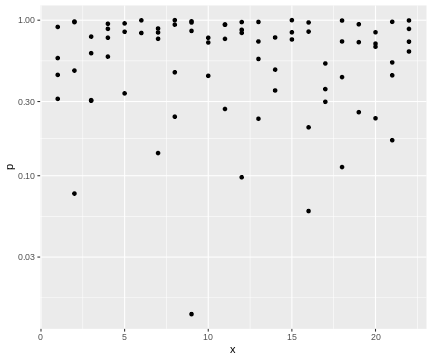

RObject{VecSxp}


In [23]:
R"""
data.frame(p = results_list.simple, x = 1:22) %>%
ggplot(aes(x=x, y = p))+
geom_point()+
scale_y_log10()
"""

In [24]:
R"""
quantile.df.simple <- data.frame()
for(line in lines){
	for(Gen_ in c(2,3)){
		obs <- observed_ecdf_simple_df_all %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
		exp <- ecdf_df %>% filter(Line == line & Gen == Gen_) %>% pull(Distance)
  # Compute the quantiles
  q1 <- quantile(obs, probs=seq(0, 1, length.out=length(obs)))
  q2 <- quantile(exp, probs=seq(0, 1, length.out=length(obs)))
  if (length(q1) > 0) {
    df <- data.frame(q1, q2, Data = paste0(line, "_", Gen_))
    quantile.df.simple <- rbind(quantile.df.simple, df)
  }
	}
}
quantile.df.simple %>% head
"""

RObject{VecSxp}
              q1        q2    Data
0%         33484    143.00 L01-1_2
33.33333% 151207  78548.33 L01-1_2
66.66667% 161929 190508.67 L01-1_2
100%      171676 531245.00 L01-1_2
0%1        31391    124.00 L01-1_3
16.66667%  66631  23075.00 L01-1_3


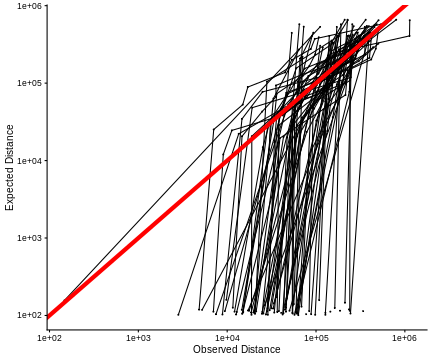

RObject{VecSxp}


In [25]:
R"""
p.qq.simple <- ggplot(quantile.df.simple, aes(x=q1, y=q2, group = Data)) + 
  geom_line() +
  geom_point(size=0.3) + 
  geom_abline(intercept = 0, slope = 1, size = 2, color = "red") + 
  xlab("Observed Distance") + 
  ylab("Expected Distance") +
  scale_x_log10()+
  scale_y_log10() +
  theme_half_open(10)
"""

### Merge QQPlot

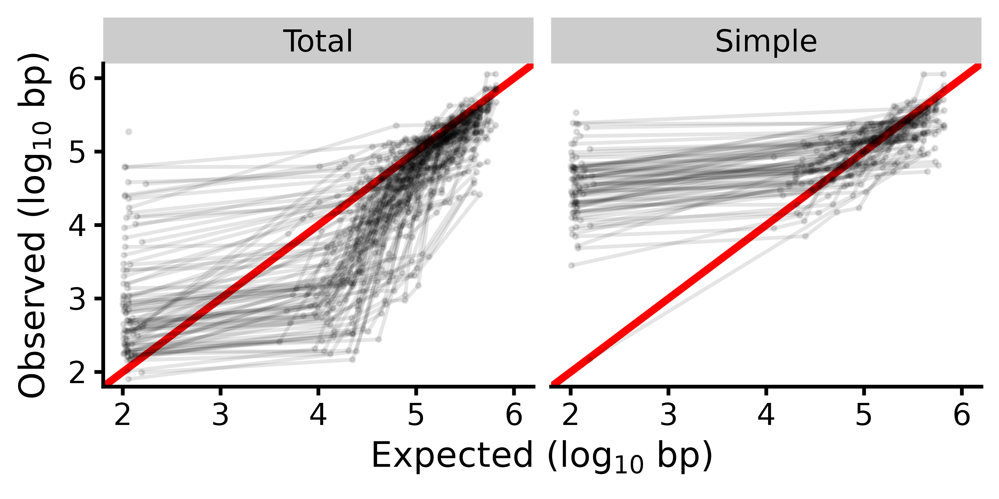

In [26]:
figure_name = figure_prefix * "qqplot_is_distance"
@rput figure_name
R"""
p <- rbind(quantile.df.total %>% mutate(Type = "Total"), quantile.df.simple %>% mutate(Type = "Simple")) %>%
mutate(Type = factor(Type, levels = c("Total", "Simple"))) %>%
ggplot(aes(x=log10(q2), y=log10(q1), group = Data)) + 
  geom_abline(intercept = 0, slope = 1, size = 1, color = "red") + 
  geom_line(alpha=0.1) +
  geom_point(size=0.3, alpha =0.1) + 
  xlab(bquote("Expected (log"[10] ~ "bp)")) + 
  ylab(bquote("Observed (log"[10] ~ "bp)")) + 
  facet_wrap(~Type, ncol = 2)+
  theme_half_open(10)+
  coord_cartesian(xlim = c(2, 6), ylim = c(2, 6))

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=100, height=50, units="mm", dpi=1000)
p.qq <- p
"""

display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))


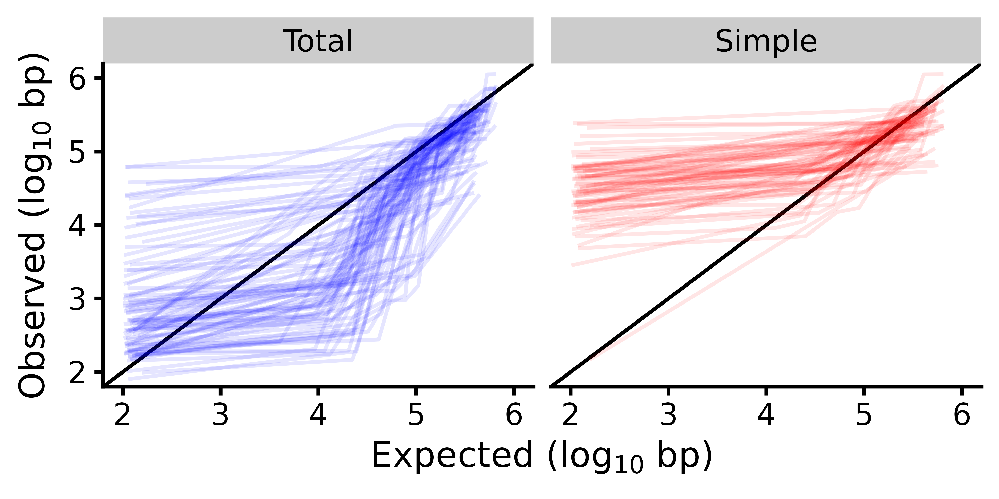

In [27]:
figure_name = figure_prefix * "qqplot_is_distance_2"
@rput figure_name
R"""
p <- rbind(quantile.df.total %>% mutate(Type = "Total"), quantile.df.simple %>% mutate(Type = "Simple")) %>%
mutate(Type = factor(Type, levels = c("Total", "Simple"))) %>%
ggplot(aes(x=log10(q2), y=log10(q1), group = Data, color = Type)) + 
  geom_abline(intercept = 0, slope = 1, size = .5, color = "black") + 
  geom_line(alpha=0.1) +
  #geom_point(size=0.1, alpha =0.2) + 
  scale_color_manual(values = c("blue", "red"))+
  xlab(bquote("Expected (log"[10] ~ "bp)")) + 
  ylab(bquote("Observed (log"[10] ~ "bp)")) + 
  facet_wrap(~Type, ncol = 2)+
  theme_half_open(10)+
  coord_cartesian(xlim = c(2, 6), ylim = c(2, 6)) +
  theme(legend.position = "none")

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=100, height=50, units="mm", dpi=1000)
p.qq <- p
"""

display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))


In [28]:
R"""
quantile.df.total %>% mutate(quantile = rownames(.)) %>%
mutate(quantile = str_split_fixed(quantile, "%", 2)[,1]) %>%
mutate(quantile = as.numeric(quantile)) %>%
head
"""

RObject{VecSxp}
          q1       q2    Data quantile
0%       311    143.0 L01-1_2      0.0
12.5%   4634  25448.0 L01-1_2     12.5
25%    13060  54869.0 L01-1_2     25.0
37.5%  33484  91046.5 L01-1_2     37.5
50%   151207 129777.0 L01-1_2     50.0
62.5% 161929 174103.5 L01-1_2     62.5


### QQplot example
Provide example of qqplot as readers may be unfamiliar.

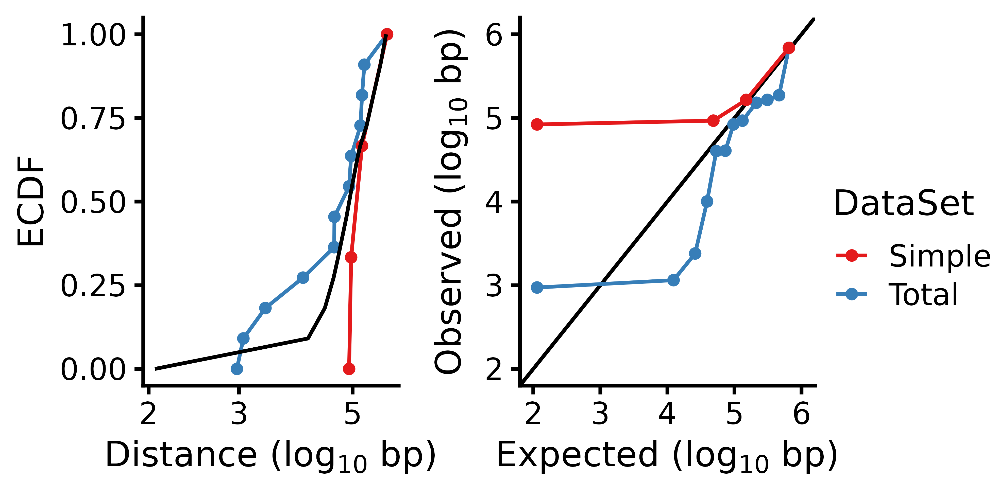

In [29]:
figure_name = figure_prefix * "qqplot_is_distance_educational_example"
@rput figure_name
R"""
df.tmp.quantile <- rbind(
  quantile.df.total  %>%
  mutate(DataSet = "Total") %>%
  mutate(quantile = rownames(.)) %>%
  mutate(quantile = str_split_fixed(quantile, "%", 2)[,1]) %>%
  mutate(quantile = as.numeric(quantile)),
  quantile.df.simple %>%
  mutate(DataSet = "Simple") %>%
  mutate(quantile = rownames(.)) %>%
  mutate(quantile = str_split_fixed(quantile, "%", 2)[,1]) %>%
  mutate(quantile = as.numeric(quantile))
  ) %>%
pivot_longer(cols = c(q1, q2), names_to = "Type", values_to = "Distance") %>%
mutate(p = quantile) %>%
filter(Data == "L02-1_2")
p.ex.quantile <-  df.tmp.quantile %>% filter(Type == "q1") %>%
#ggplot(aes(x= log10(Distance), y=p, linetype = Type, color = DataSet)) + 
ggplot(aes(x= log10(Distance), y=p/100, linetype = Type, color = DataSet)) + 
  geom_line() +
  geom_point(size=1, alpha =1) +
  scale_color_brewer(palette = "Set1") +
  geom_line(data= df.tmp.quantile %>% filter(Type == "q2"), color = "black", linetype = "solid") +
  xlab(bquote("Distance (log"[10] ~ "bp)")) + 
  ylab(bquote("ECDF")) + 
  #ylab(bquote("Percentile")) + 
  scale_x_log10()+
  theme_half_open(10) +
  guides(linetype = "none")

p.ex.qq <- df.tmp.quantile %>% pivot_wider(names_from = Type, values_from = Distance) %>%
ggplot(aes(x=log10(q2), y=log10(q1), group = DataSet, color = DataSet, fill = DataSet)) + 
  geom_abline(intercept = 0, slope = 1, size = 0.5, color = "black") + 
  geom_line() +
  geom_point(size=1, alpha =1) + 
  scale_color_brewer(palette = "Set1", name = "Dataset") +
  xlab(bquote("Expected (log"[10] ~ "bp)")) + 
  ylab(bquote("Observed (log"[10] ~ "bp)")) + 
  theme_half_open(10)+
  coord_cartesian(xlim = c(2, 6), ylim = c(2, 6)) +
  theme(legend.position = "none")

p <-
plot_grid(
plot_grid(p.ex.quantile + theme(legend.position = "none"),
p.ex.qq,
ncol = 2, rel_widths = c(1, 1)),
get_legend(p.ex.quantile), rel_widths = c(1, .2))

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=100, height=50, units="mm", dpi=1000)
"""
display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))

### Aggregate KS test results

In [30]:
R"""
ks.total %>% mutate(ID = 1:n()) %>% 
pivot_longer(cols = c("total", "simple"), names_to = "Type", values_to = "p") %>%
mutate(significant = ifelse(p < 0.05, "Significant", "Not Significant"))  %>%
group_by(Type) %>% summarise(Count = sum(significant == "Significant"), Total = n())
"""

RObject{VecSxp}
# A tibble: 2 × 3
  Type   Count Total
  <chr>  <int> <int>
1 simple     1    88
2 total     34    88


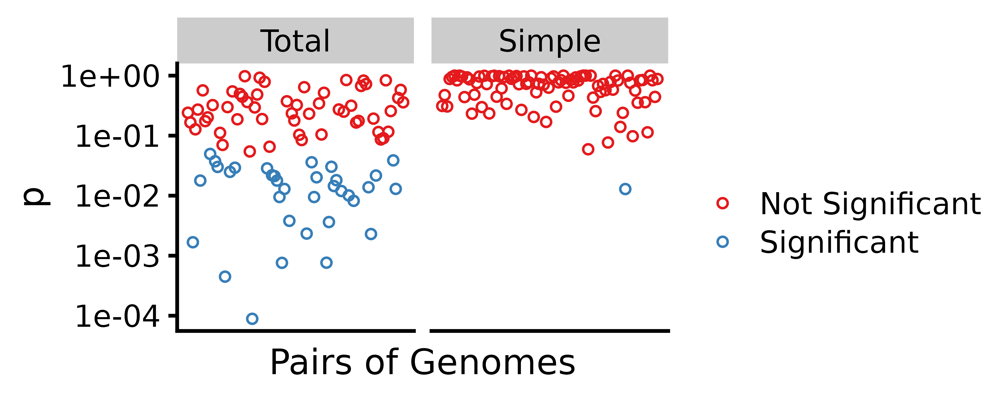

In [31]:
figure_name = figure_prefix * "KS-test_is_distance"
@rput figure_name
R"""
p <- ks.total %>% mutate(ID = 1:n()) %>% 
pivot_longer(cols = c("total", "simple"), names_to = "Type", values_to = "p") %>%
mutate(significant = ifelse(p < 0.05, "Significant", "Not Significant"))  %>%
mutate(Type = ifelse(Type == "total", "Total", "Simple")) %>%
mutate(Type = factor(Type, levels = c("Total", "Simple"))) %>%
ggplot(aes(x = ID, y = p, color = significant)) +
geom_point(size = 1, shape =1) + facet_wrap(~Type, ncol = 2) +
scale_y_log10() +
xlab("Pairs of Genomes") +
scale_color_brewer(palette = "Set1", name ="") +
theme_half_open(10) +
theme(axis.text.x = element_blank(), axis.ticks.x = element_blank())

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=100, height=40, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=100, height=40, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=100, height=40, units="mm", dpi=1000)
"""

display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))

# Run AD-test and combine with fisher
The distribution of qqplot and the interpretation of Lee, 2016 suggests that the shorter tail is important. AD tests are more suitable than KS in this case, so though qualitatively the same, I used AD tests instead in the paper.

In [32]:
using HypothesisTests

In [33]:
adtests = DataFrame(
	Line = String[],
	Gen = Int64[],
	pvalue = Float64[],
	type = String[]
)
for line in lines
	for Gen_ in [2,3]
		obs = observed_ecdf_df_all[(observed_ecdf_df_all.Line .== line) .& (observed_ecdf_df_all.Gen .== Gen_), :].Distance
		exp = ecdf_df[(ecdf_df.Line .== line) .& (ecdf_df.Gen .== Gen_), :].Distance
		p_ = 1.0
		try
			test_ = HypothesisTests.KSampleADTest(obs, exp)
			p_ = pvalue(test_)
		catch e
			showerror(stdout, e)
			println("error in ", line, " ", Gen_)
		end
		adtests = vcat(adtests, DataFrame(Line = [line], Gen = [Gen_], pvalue = [p_], type = ["total"]))
	end
end
for line in lines
	for Gen_ in [2,3]
		obs = observed_ecdf_simple_df_all[(observed_ecdf_simple_df_all.Line .== line) .& (observed_ecdf_simple_df_all.Gen .== Gen_), :].Distance
		exp = ecdf_df[(ecdf_df.Line .== line) .& (ecdf_df.Gen .== Gen_), :].Distance
		p_ = 1.0
		try
			test_ = HypothesisTests.KSampleADTest(obs, exp)
			p_ = pvalue(test_)
		catch e
			showerror(stdout, e)
			println("error in ", line, " ", Gen_)
		end
		adtests = vcat(adtests, DataFrame(Line = [line], Gen = [Gen_], pvalue = [p_], type = ["simple"]))
	end
end
first(adtests, 5)

One of the samples is emptyerror in L01-3 3
One of the samples is emptyerror in L07-1 3
One of the samples is emptyerror in L08-1 3
One of the samples is emptyerror in L08-2 2
One of the samples is emptyerror in L08-3 2
One of the samples is emptyerror in L09-4 2
One of the samples is emptyerror in L10-2 3
One of the samples is emptyerror in L11-3 2


Row,Line,Gen,pvalue,type
,String,Int64,Float64,String
1,L01-1,2,0.133489,total
2,L01-1,3,0.0251957,total
3,L01-2,2,2.32295e-5,total
4,L01-2,3,0.0524266,total
5,L01-3,2,0.134038,total


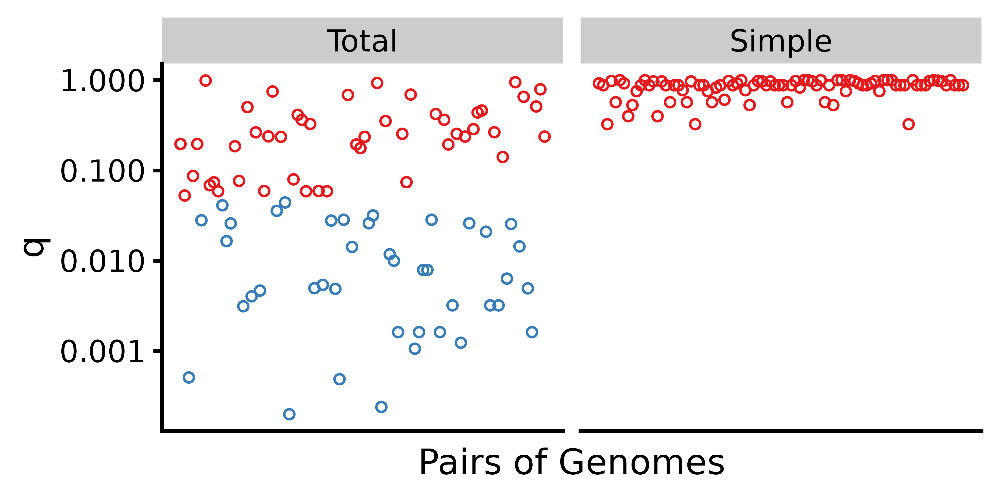

In [34]:
@rput adtests
figure_name = figure_prefix * "AD-test_is_distance"
@rput figure_name
R"""
p <- adtests  %>% 
mutate(qvalue = c(p.adjust(adtests%>%filter(type == "total") %>% pull(pvalue), method = "BH"),
p.adjust(adtests%>%filter(type == "simple") %>% pull(pvalue), method = "BH"))) %>%
mutate(significant = ifelse(qvalue < 0.05, "Significant", "Not Significant"))  %>%
mutate(label = paste0(Line, "_", Gen)) %>%
mutate(Type = ifelse(type == "total", "Total", "Simple")) %>%
mutate(Type = factor(Type, levels = c("Total", "Simple"))) %>%
ggplot(aes(x = label, y = qvalue, color = significant)) +
geom_point(size = 1, shape =1)+
scale_color_brewer(palette = "Set1", name ="") +
scale_x_discrete(expand = c(0.05, 0.05)) +
scale_y_log10()+
facet_wrap(~Type, ncol = 2)+
theme_half_open(10) +
ylab("q") +
xlab("Pairs of Genomes") +
theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), legend.position = "none")
p.ad <- p

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=100, height=50, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=100, height=50, units="mm", dpi=1000)
"""

display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))

### Aggregate the statistics

In [35]:
R"""
adtests  %>% 
mutate(qvalue = c(p.adjust(adtests%>%filter(type == "total") %>% pull(pvalue), method = "BH"),
p.adjust(adtests%>%filter(type == "simple") %>% pull(pvalue), method = "BH"))) %>%
filter(qvalue < 1e-3) 
"""

RObject{VecSxp}
   Line Gen       pvalue  type       qvalue
1 L01-2   2 2.322953e-05 total 0.0005110498
2 L04-2   2 2.272896e-06 total 0.0002000148
3 L05-4   2 1.666280e-05 total 0.0004887754
4 L07-1   2 5.472740e-06 total 0.0002408006


In [36]:
R"""
## old before removing L04-1 G20
library(metap)
sumlog(adtests %>% filter(type == "total") %>% pull(pvalue)) %>% print
sumlog(adtests %>% filter(type == "simple") %>% pull(pvalue)) %>% print
"""

chisq =  723.0172  with df =  176  p =  2.240678e-67 
chisq =  196.1114  with df =  176  p =  0.1425683 


RObject{VecSxp}
chisq =  196.1114  with df =  176  p =  0.1425683 


In [37]:
R"""
adtests %>% filter(Line == "L04-1", Gen == 3)
"""

RObject{VecSxp}
   Line Gen     pvalue   type
1 L04-1   3 0.02063309  total
2 L04-1   3 0.28237825 simple


## STATS: chisq and P value

In [38]:
R"""
## 20240224 after removing L04-1 G20
library(metap)
sumlog(adtests %>% filter(!((Line == "L04-1")&(Gen == 3))) %>% filter(type == "total") %>% pull(pvalue)) %>% print
sumlog(adtests %>% filter(!((Line == "L04-1")&(Gen == 3))) %>% filter(type == "simple") %>% pull(pvalue)) %>% print
""";

chisq =  715.2555  with df =  174  p =  1.032729e-66 
chisq =  193.5824  with df =  174  p =  0.1472802 


In [57]:
R""" # just to check composition
observed_ecdf_simple_df_all %>% filter(!((Line == "L04-1")&(Gen == 3)))%>% group_by(Line, Gen) %>% summarise(n= n()) %>% data.frame
"""

┌ Warning: RCall.jl: `summarise()` has grouped output by 'Line'. You can override using the
│ `.groups` argument.
└ @ RCall ~/.julia/packages/RCall/gOwEW/src/io.jl:172


RObject{VecSxp}
    Line Gen  n
1  L01-1   2  4
2  L01-1   3  7
3  L01-2   2  2
4  L01-2   3  6
5  L01-3   2  8
6  L01-4   2  7
7  L01-4   3  6
8  L02-1   2  4
9  L02-1   3  9
10 L02-2   2  6
11 L02-2   3  2
12 L02-3   2  7
13 L02-3   3  2
14 L02-4   2  9
15 L02-4   3  5
16 L03-1   2  5
17 L03-1   3  2
18 L03-2   2  7
19 L03-2   3  3
20 L03-3   2  9
21 L03-3   3  6
22 L03-4   2 12
23 L03-4   3  9
24 L04-1   2  6
25 L04-2   2  4
26 L04-2   3  5
27 L04-3   2  8
28 L04-3   3  5
29 L04-4   2  3
30 L04-4   3  6
31 L05-1   2  7
32 L05-1   3  2
33 L05-2   2  7
34 L05-2   3  8
35 L05-3   2  8
36 L05-3   3  1
37 L05-4   2  5
38 L05-4   3  4
39 L06-1   2  4
40 L06-1   3  5
41 L06-2   2 11
42 L06-2   3  2
43 L06-3   2  6
44 L06-3   3  4
45 L06-4   2 10
46 L06-4   3  4
47 L07-1   2  3
48 L07-2   2  2
49 L07-2   3  2
50 L07-3   2  1
51 L07-3   3  2
52 L07-4   2  2
53 L07-4   3  2
54 L08-1   2  1
55 L08-2   3  8
56 L08-3   3  1
57 L08-4   2  1
58 L08-4   3  2
59 L09-1   2  2
60 L09-1   3  1
61 L09-2

In [51]:
R""" # Note the difference from the number of simple insertions, as we included simple transpositions of composite transposons too.
# numbers excluding L04-1 G20 -> used in paper
print(paste("Total Ins:", observed_ecdf_df_all %>% filter(!((Line == "L04-1")&(Gen == 3)))%>% nrow))
print(paste("Simple Ins:", observed_ecdf_simple_df_all %>% filter(!((Line == "L04-1")&(Gen == 3)))%>% nrow))
""";

[1] "Total Ins: 890"
[1] "Simple Ins: 367"


In [46]:
R"""
observed_ecdf_df_all %>% nrow %>% print
observed_ecdf_simple_df_all %>% nrow  %>% print
""";

[1] 904
[1] 372


# Merge all the plots
To make the plots arranged neatlly.

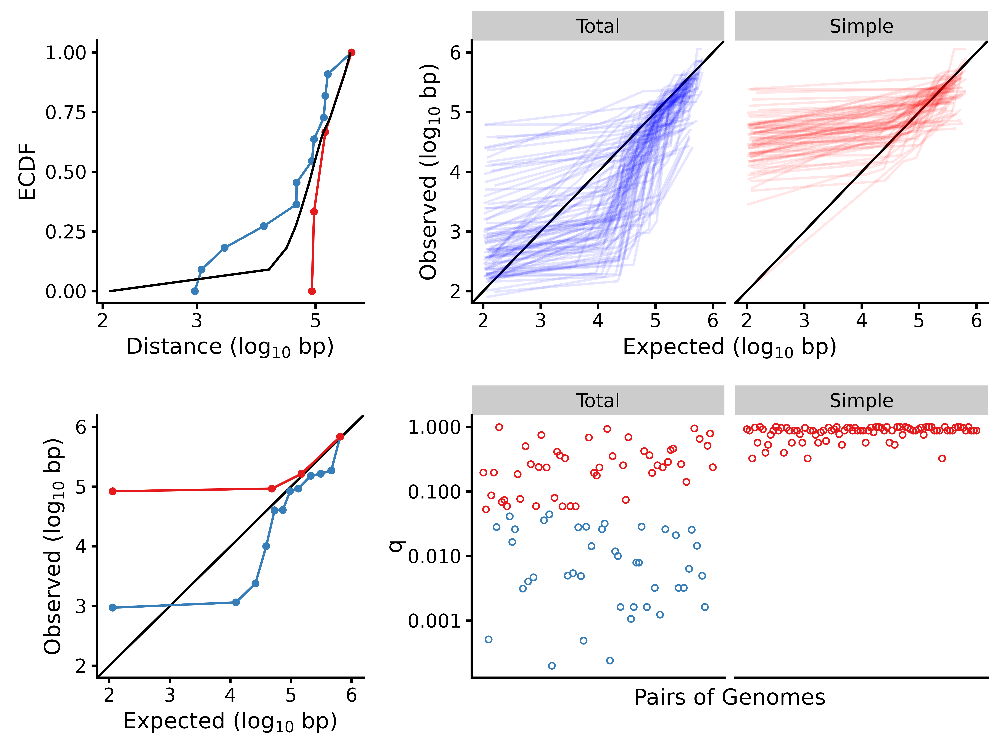

In [39]:
figure_name = figure_prefix * "example_qq_ad_test_merged"
@rput figure_name
R"""
p <- plot_grid(p.ex.quantile + theme(legend.position = "none"), p.qq, p.ex.qq, p.ad, ncol = 2, rel_widths = c(.6, 1),
	align = "hv", axis = "lrbt")

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=160, height=120, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=160, height=120, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=160, height=120, units="mm", dpi=1000)
"""

display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))

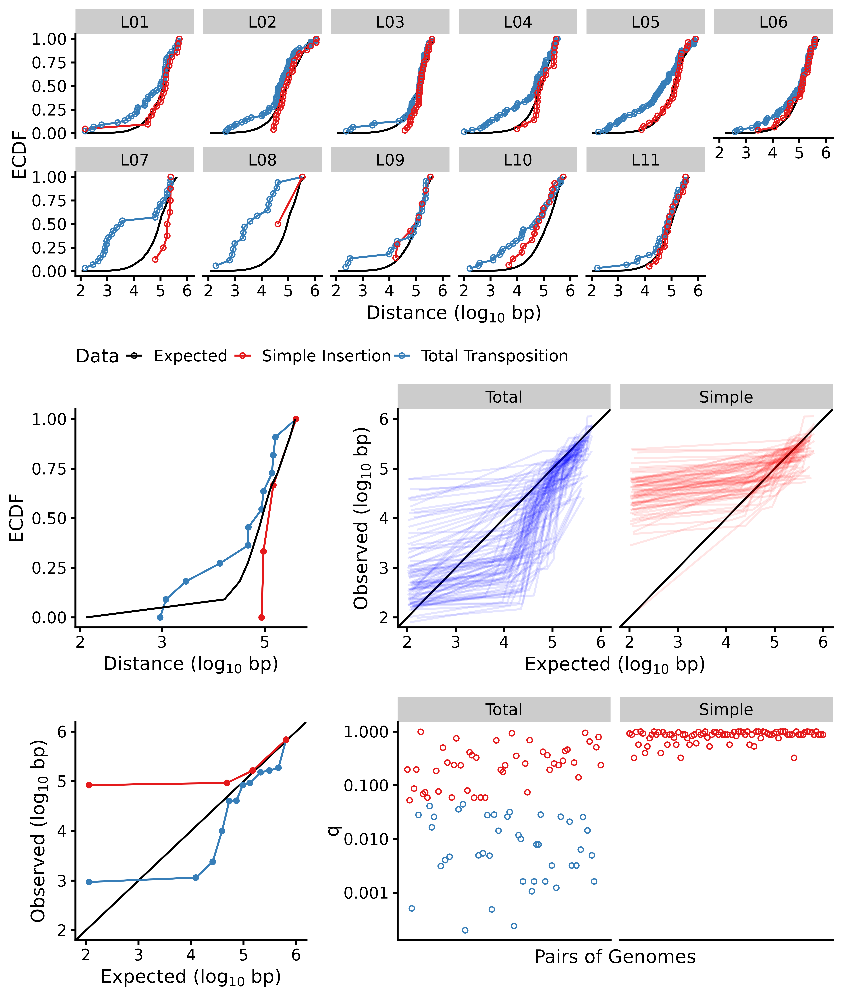

In [40]:
figure_name = figure_prefix * "example_qq_ad_test_merged2"
@rput figure_name
R"""
p.ecdf.gen8

p.tmp <- align_plots(p.ecdf.gen8, p.ex.quantile  + theme(legend.position = "none"), p.ex.qq, align = "v", axis = "l")
p.tmp2 <- align_plots(p.qq, p.ad, align = "v", axis = "l")

p<- plot_grid(p.tmp[[1]],
plot_grid(p.tmp[[2]], p.tmp2[[1]], nrow = 1, align = "h", axis = "tb", rel_widths = c(.6, 1)),
plot_grid(p.tmp[[3]], p.tmp2[[2]], nrow = 1, align = "h", axis = "tb", rel_widths = c(.6, 1)),
rel_heights = c(1.2, 1,1), ncol = 1, align = "", axis = "rbt")

ggsave(paste0(figure_export_dir,"/", figure_name, ".png"), p, width=160, height=190, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".pdf"), p, width=160, height=190, units="mm", dpi=1000)
ggsave(paste0(figure_export_dir,"/", figure_name, ".svg"), p, width=160, height=190, units="mm", dpi=1000)
"""

display("image/png", read(joinpath(figure_export_dir, figure_name * ".png")))